<a href="https://colab.research.google.com/github/choyingw/SynergyNet/blob/main/synergy_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
print('\n> Cloning the repo')
!git clone https://github.com/choyingw/SynergyNet

% cd SynergyNet


> Cloning the repo
fatal: destination path 'SynergyNet' already exists and is not an empty directory.
/content/SynergyNet


In [2]:
% cd Sim3DR
!sh ./build_sim3dr.sh

% cd ../FaceBoxes
!sh ./build_cpu_nms.sh
% cd ..

!gdown --id 1SQsMhvAmpD1O8Hm0yEGom0C0rXtA0qs8
!unzip -n 3dmm_data

!gdown --id 1BVHbiLTfX6iTeJcNbh-jgHjWDoemfrzG

% ls

/content/SynergyNet/Sim3DR
running build_ext
cythoning lib/rasterize.pyx to lib/rasterize.cpp
/usr/local/lib/python3.7/dist-packages/Cython/Compiler/Main.py:369: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later release! File: /content/SynergyNet/Sim3DR/lib/rasterize.pyx
  tree = Parsing.p_module(s, pxd, full_module_name)
building 'Sim3DR_Cython' extension
creating build
creating build/temp.linux-x86_64-3.7
creating build/temp.linux-x86_64-3.7/lib
x86_64-linux-gnu-gcc -pthread -Wno-unused-result -Wsign-compare -DNDEBUG -g -fwrapv -O2 -Wall -g -fstack-protector-strong -Wformat -Werror=format-security -g -fwrapv -O2 -g -fstack-protector-strong -Wformat -Werror=format-security -Wdate-time -D_FORTIFY_SOURCE=2 -fPIC -I/usr/local/lib/python3.7/dist-packages/numpy/core/include -I/usr/include/python3.7m -c lib/rasterize.cpp -o build/temp.linux-x86_64-3.7/lib/rasterize.o -std=c++11
In file included from /usr/local/lib/python3.7/dist-pac

In [3]:
!mv best.pth.tar  ./pretrained
% ls

3dmm_data/              demo/                pretrained/
3dmm_data.zip           FaceBoxes/           README.md
artistic.py             img/                 Sim3DR/
backbone_nets/          LICENSE              singleImage.py
benchmark_aflw2000.py*  loss_definition.py*  train_script.sh
benchmark.py*           main_train.py        utils/
benchmark_validate.py   model_building.py*   uv_texture_realFaces.py


In [18]:
import torch
import torchvision.transforms as transforms
import numpy as np
import cv2
from utils.ddfa import ToTensor, Normalize
from model_building import SynergyNet
from utils.inference import crop_img, predict_sparseVert, draw_landmarks, predict_denseVert, predict_pose, draw_axis
import argparse
import torch.backends.cudnn as cudnn
cudnn.benchmark = True
import os
import os.path as osp
import glob
from FaceBoxes import FaceBoxes
from utils.render import render
import scipy.io as sio

In [20]:
# Following 3DDFA-V2, we also use 120x120 resolution
IMG_SIZE = 120

def main(args):
    # load pre-tained model
    checkpoint_fp = 'pretrained/best.pth.tar' 
    args.arch = 'mobilenet_v2'
    args.devices_id = [0]

    checkpoint = torch.load(checkpoint_fp, map_location=lambda storage, loc: storage)['state_dict']
    
    model = SynergyNet(args)
    model_dict = model.state_dict()

    # because the model is trained by multiple gpus, prefix 'module' should be removed
    for k in checkpoint.keys():
        model_dict[k.replace('module.', '')] = checkpoint[k]

    model.load_state_dict(model_dict, strict=False)
    model = model.cuda()
    model.eval()

    # face detector
    face_boxes = FaceBoxes()

    # preparation
    transform = transforms.Compose([ToTensor(), Normalize(mean=127.5, std=128)])
    if osp.isdir(args.files):
        if not args.files[-1] == '/':
            args.files = args.files + '/'
        if not args.png:
            files = sorted(glob.glob(args.files+'*.jpg'))
        else:
            files = sorted(glob.glob(args.files+'*.png'))
    else:
        files = [args.files]

    def _to_ctype(arr):
        if not arr.flags.c_contiguous:
            return arr.copy(order='C')
        return arr
    tri = sio.loadmat('./3dmm_data/tri.mat')['tri'] - 1

    for img_fp in files:
        print("Process the image: ", img_fp)

        img_ori = cv2.imread(img_fp)

        # crop faces
        rects = face_boxes(img_ori)

        # storage
        pts_res = []
        poses = []
        vertices_lst = []
        for idx, rect in enumerate(rects):
            roi_box = rect

            # enlarge the bbox a little and do a square crop
            HCenter = (rect[1] + rect[3])/2
            WCenter = (rect[0] + rect[2])/2
            side_len = roi_box[3]-roi_box[1]
            margin = side_len * 1.2 // 2
            roi_box[0], roi_box[1], roi_box[2], roi_box[3] = WCenter-margin, HCenter-margin, WCenter+margin, HCenter+margin

            img = crop_img(img_ori, roi_box)
            img = cv2.resize(img, dsize=(IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_LINEAR)
            # cv2.imwrite(f'validate_{idx}.png', img)
            
            input = transform(img).unsqueeze(0)
            with torch.no_grad():
                input = input.cuda()
                param = model.forward_test(input)
                param = param.squeeze().cpu().numpy().flatten().astype(np.float32)

            # inferences
            lmks = predict_sparseVert(param, roi_box, transform=True)
            vertices = predict_denseVert(param, roi_box, transform=True)
            angles, translation = predict_pose(param, roi_box)

            pts_res.append(lmks)
            vertices_lst.append(vertices)
            poses.append([angles, translation, lmks])

        if not osp.exists(f'inference_output/rendering_overlay/'):
            os.makedirs(f'inference_output/rendering_overlay/')
        if not osp.exists(f'inference_output/landmarks/'):
            os.makedirs(f'inference_output/landmarks/')
        if not osp.exists(f'inference_output/poses/'):
            os.makedirs(f'inference_output/poses/')
        
        name = img_fp.rsplit('/',1)[-1][:-4]
        img_ori_copy = img_ori.copy()

        # mesh
        render(img_ori, vertices_lst, alpha=0.6, wfp=f'inference_output/rendering_overlay/{name}.jpg', connectivity=tri)
        
        # landmarks
        draw_landmarks(img_ori_copy, pts_res, wfp=f'inference_output/landmarks/{name}.jpg')
        
        # face orientation
        img_axis_plot = img_ori_copy
        for angles, translation, lmks in poses:
            img_axis_plot = draw_axis(img_axis_plot, angles[0], angles[1],
                angles[2], translation[0], translation[1], size = 50, pts68=lmks)
        wfp = f'inference_output/poses/{name}.jpg'
        cv2.imwrite(wfp, img_axis_plot)
        print(f'Save pose result to {wfp}')

In [21]:
parser = argparse.ArgumentParser()
parser.add_argument('-f', '--files', default='./img/', help='path to a single image or path to a folder containing multiple images')
parser.add_argument("--png", action="store_true", help="if images are with .png extension")
parser.add_argument('--img_size', default=120, type=int)
parser.add_argument('-b', '--batch-size', default=1, type=int)

args = parser.parse_args()
args.files = 'img'


main(args)

Process the image:  img/sample_1.jpg
Save mesh result to inference_output/rendering_overlay/sample_1.jpg
Save landmark result to inference_output/landmarks/sample_1.jpg
Save pose result to inference_output/poses/sample_1.jpg
Process the image:  img/sample_2.jpg
Save mesh result to inference_output/rendering_overlay/sample_2.jpg
Save landmark result to inference_output/landmarks/sample_2.jpg
Save pose result to inference_output/poses/sample_2.jpg
Process the image:  img/sample_3.jpg
Save mesh result to inference_output/rendering_overlay/sample_3.jpg
Save landmark result to inference_output/landmarks/sample_3.jpg
Save pose result to inference_output/poses/sample_3.jpg
Process the image:  img/sample_4.jpg
Save mesh result to inference_output/rendering_overlay/sample_4.jpg
Save landmark result to inference_output/landmarks/sample_4.jpg
Save pose result to inference_output/poses/sample_4.jpg


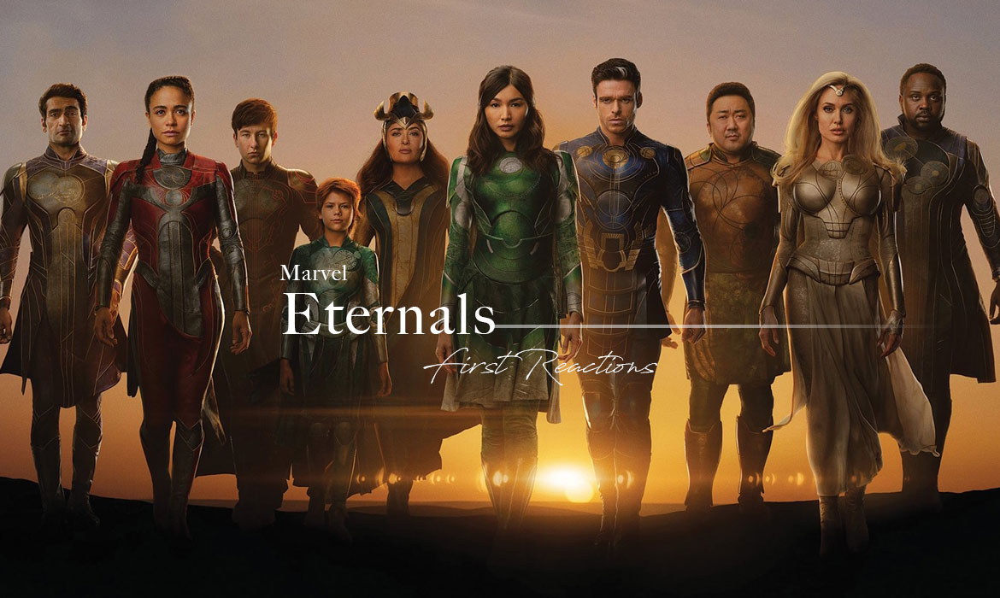

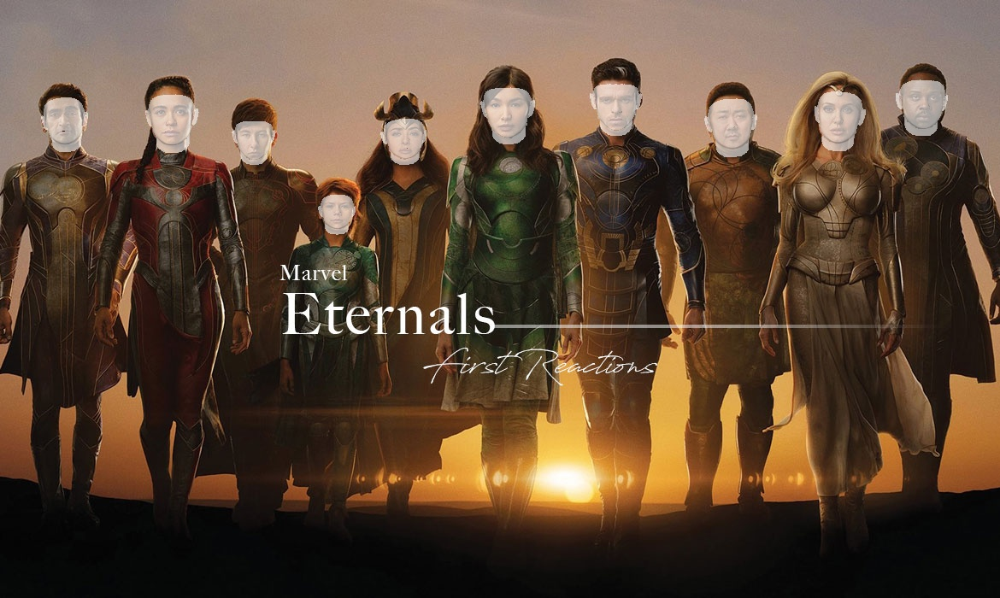

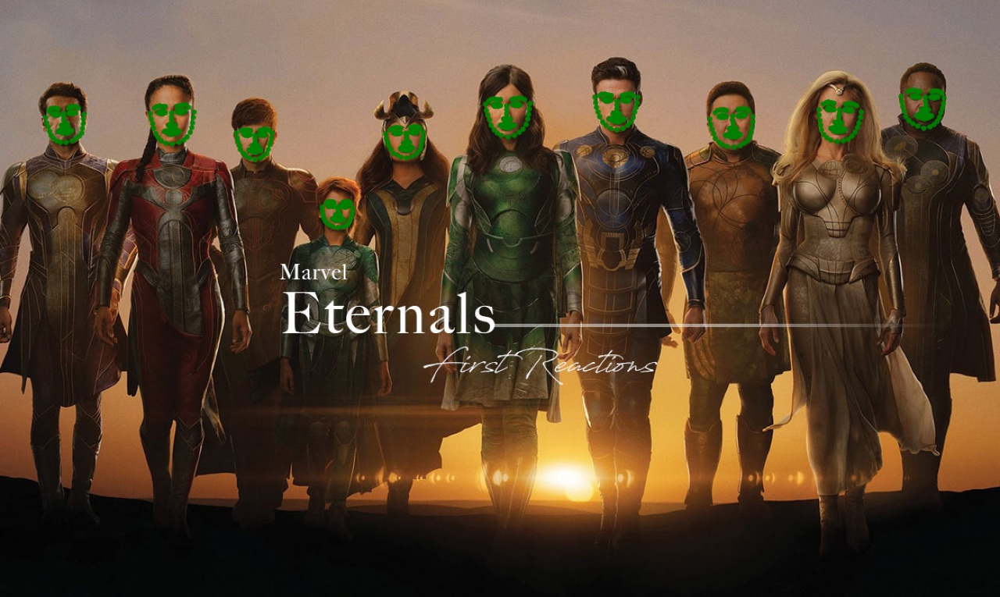

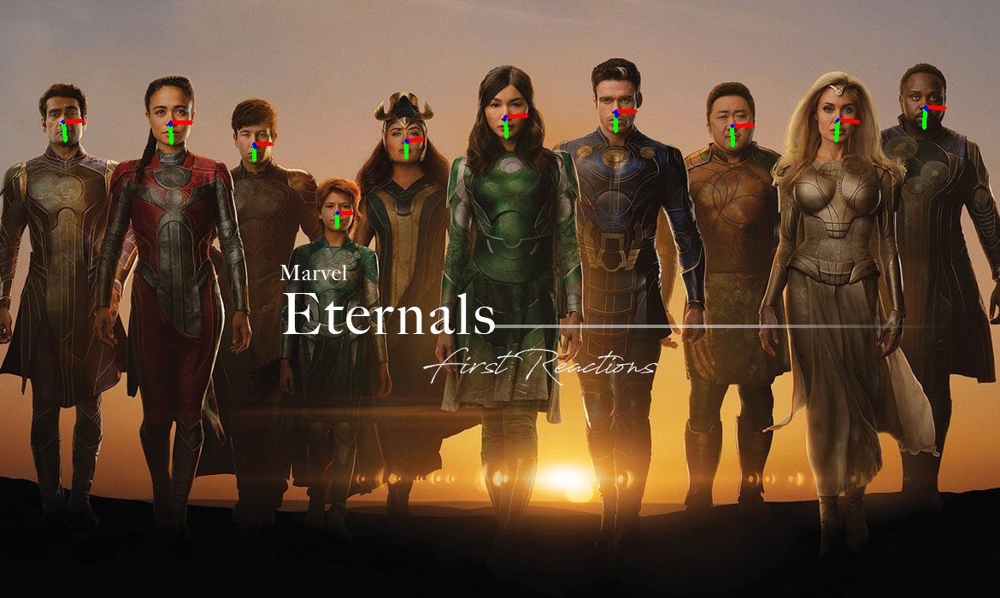

In [22]:
from google.colab.patches import cv2_imshow
I_img = cv2.imread('img/sample_1.jpg', -1)
I_overlay = cv2.imread('inference_output/rendering_overlay/sample_1.jpg', -1)
I_landmark = cv2.imread('inference_output/landmarks/sample_1.jpg', -1)
I_pose = cv2.imread('inference_output/poses/sample_1.jpg', -1)
cv2_imshow(I_img)
cv2_imshow(I_overlay)
cv2_imshow(I_landmark)
cv2_imshow(I_pose)

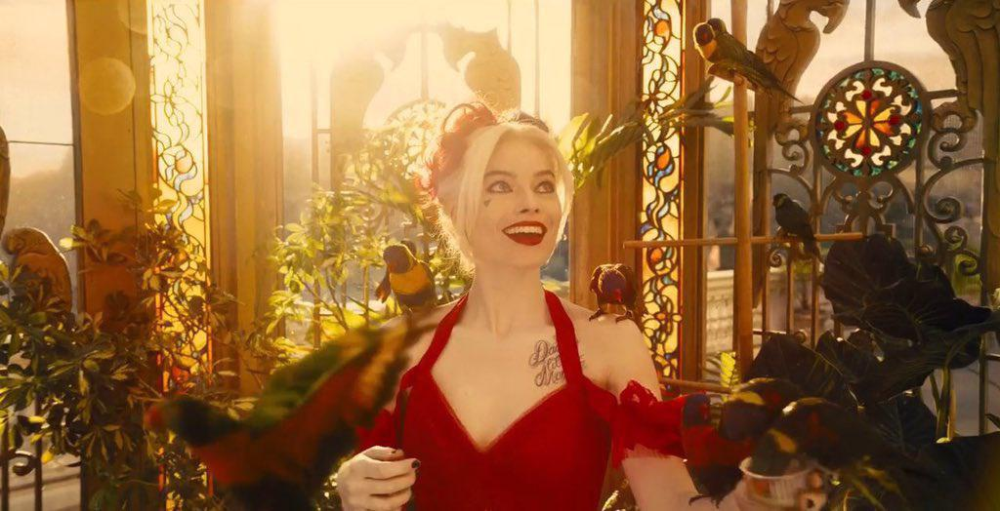

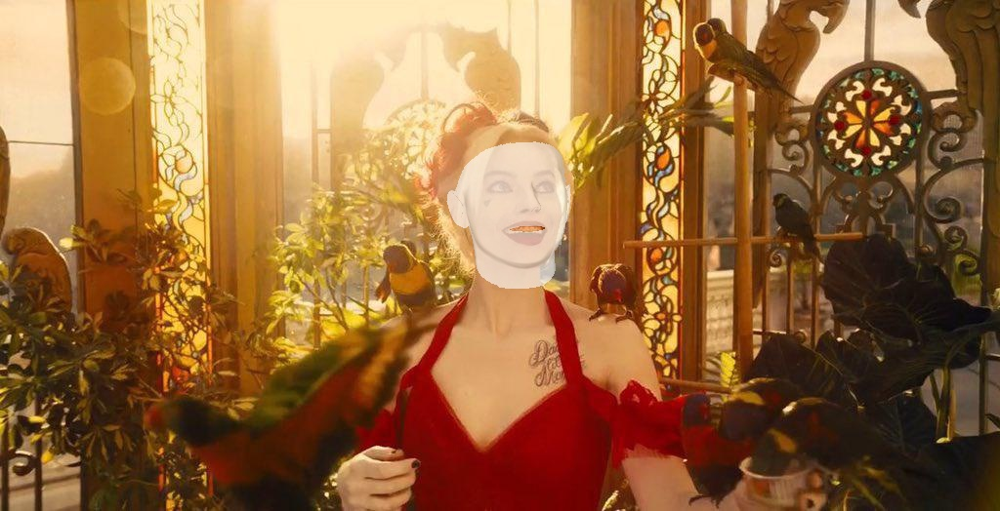

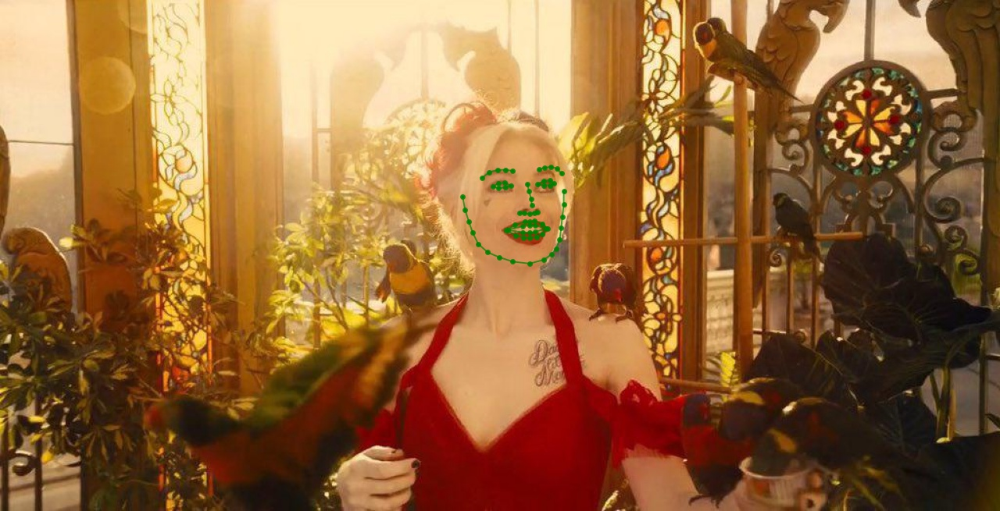

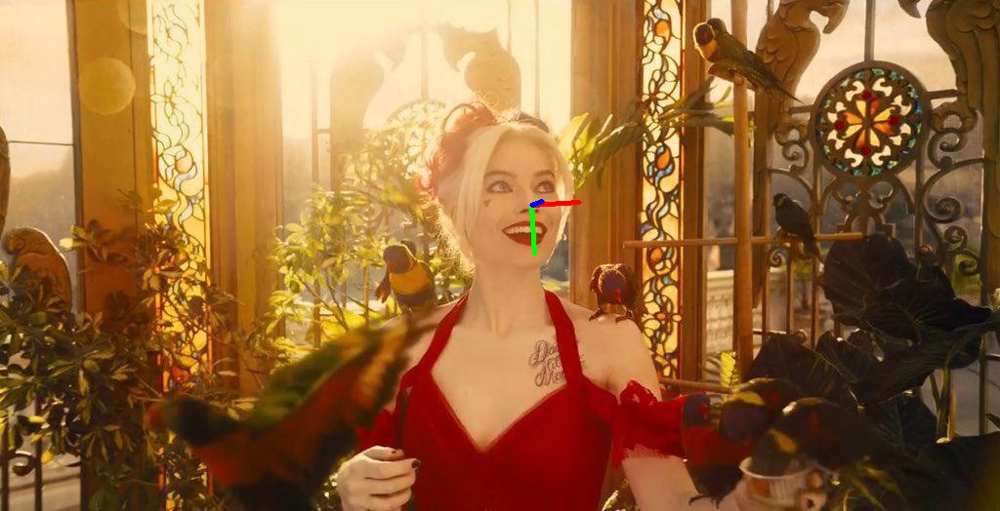

In [23]:
I_img = cv2.imread('img/sample_2.jpg', -1)
I_overlay = cv2.imread('inference_output/rendering_overlay/sample_2.jpg', -1)
I_landmark = cv2.imread('inference_output/landmarks/sample_2.jpg', -1)
I_pose = cv2.imread('inference_output/poses/sample_2.jpg', -1)
cv2_imshow(I_img)
cv2_imshow(I_overlay)
cv2_imshow(I_landmark)
cv2_imshow(I_pose)

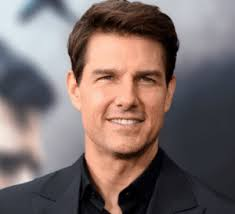

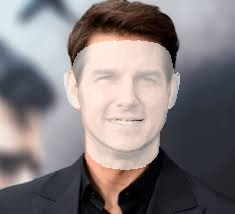

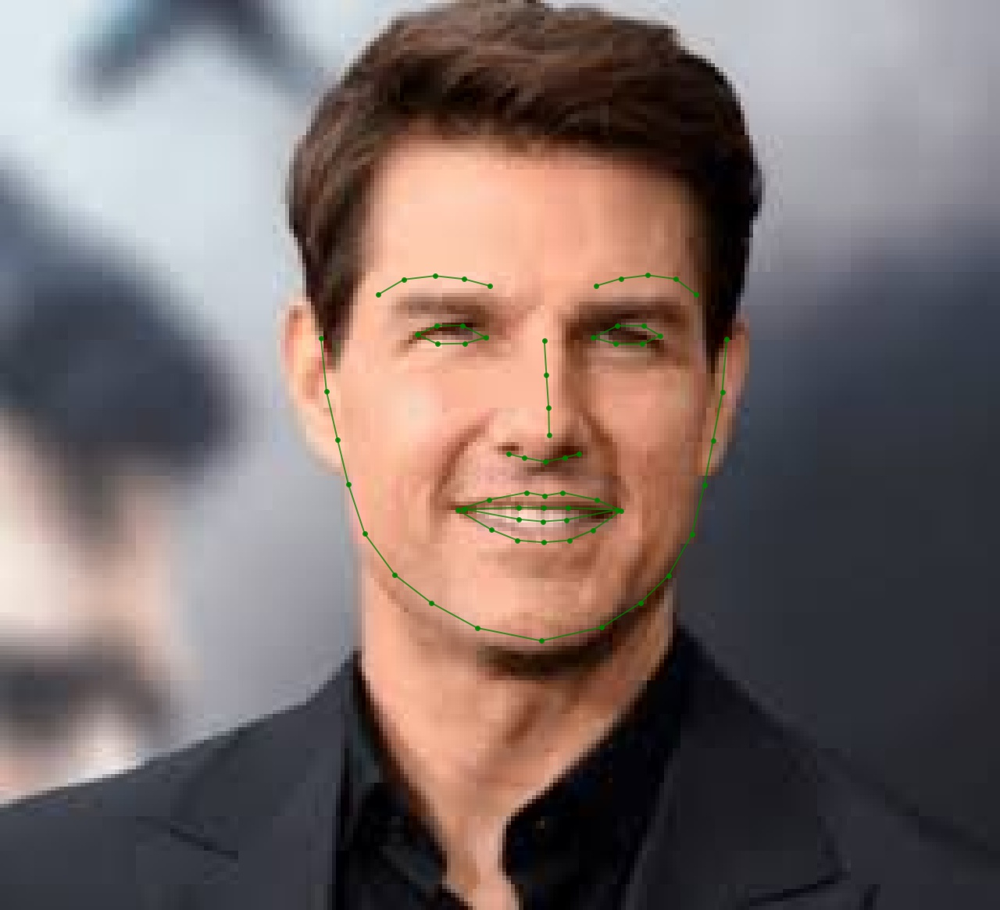

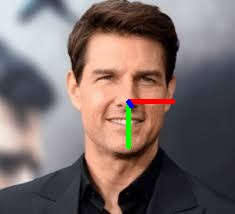

In [24]:
I_img = cv2.imread('img/sample_3.jpg', -1)
I_overlay = cv2.imread('inference_output/rendering_overlay/sample_3.jpg', -1)
I_landmark = cv2.imread('inference_output/landmarks/sample_3.jpg', -1)
I_pose = cv2.imread('inference_output/poses/sample_3.jpg', -1)
cv2_imshow(I_img)
cv2_imshow(I_overlay)
cv2_imshow(I_landmark)
cv2_imshow(I_pose)

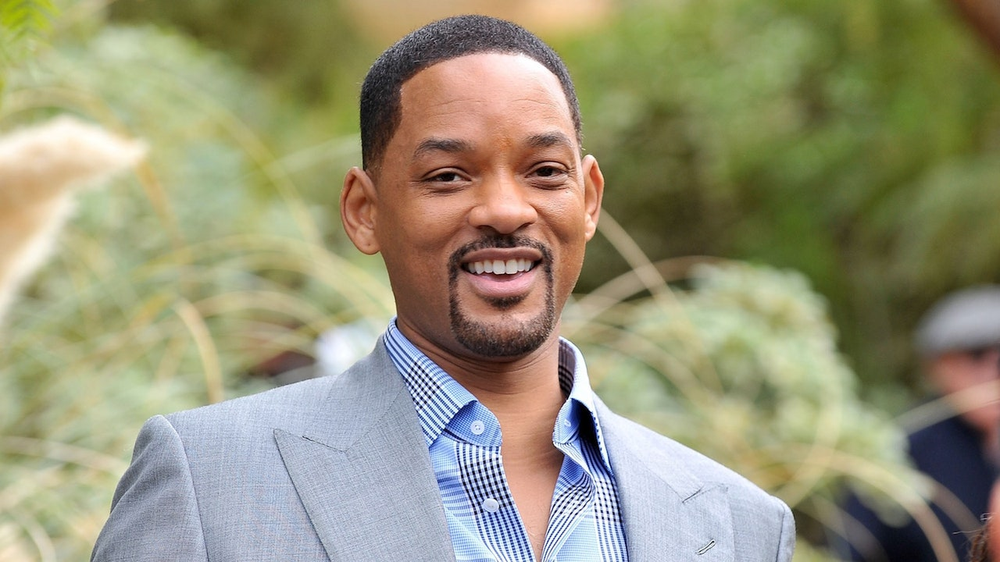

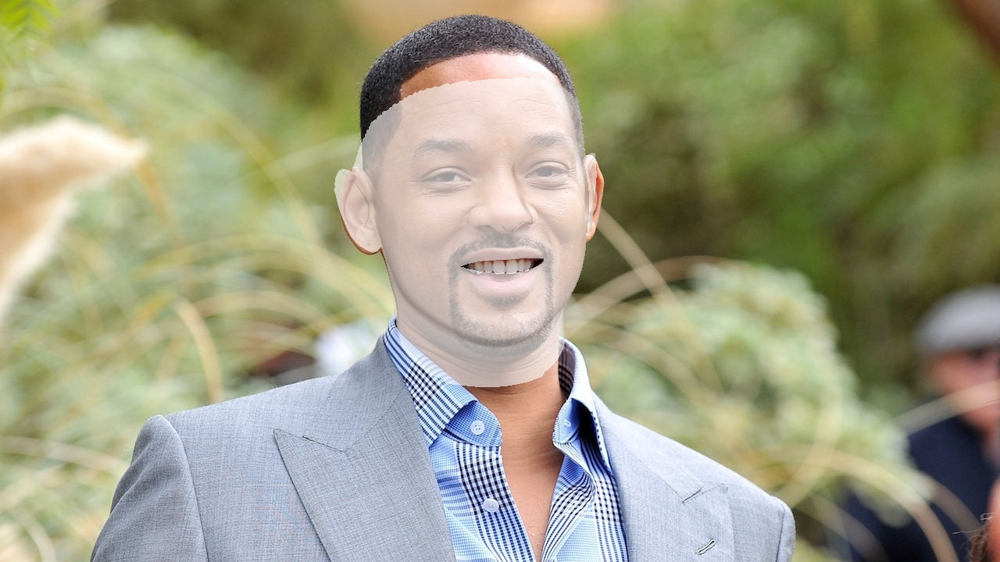

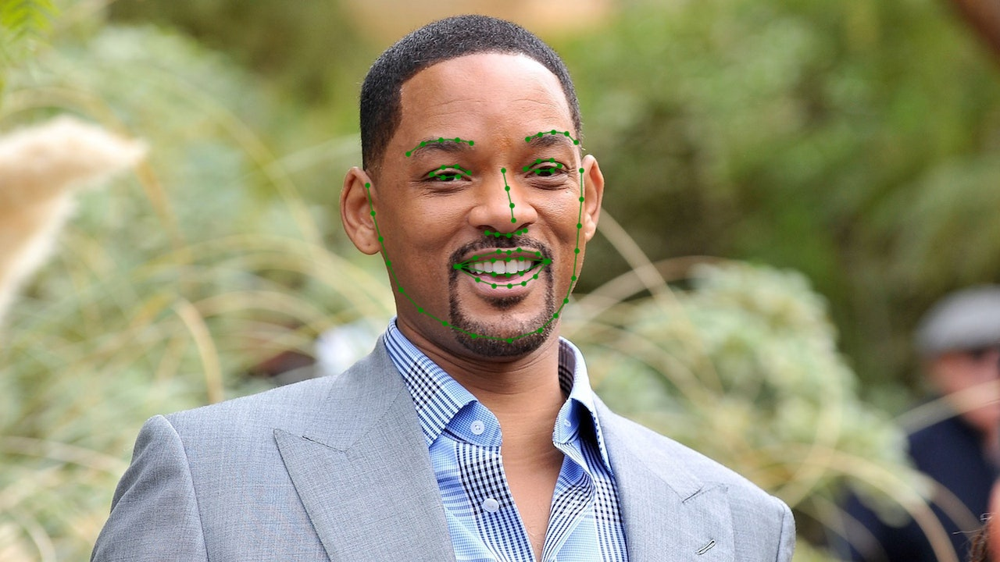

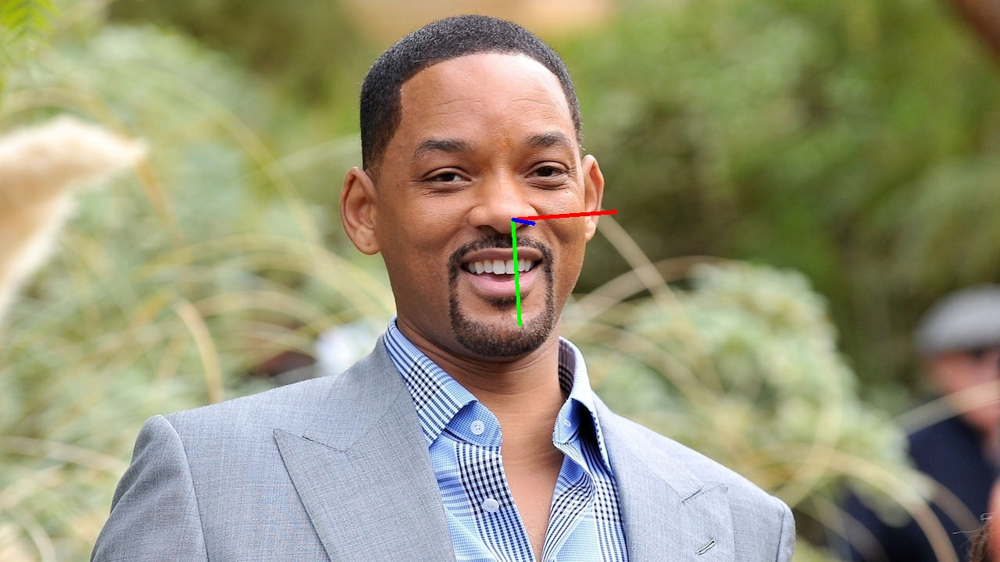

In [25]:
I_img = cv2.imread('img/sample_4.jpg', -1)
I_overlay = cv2.imread('inference_output/rendering_overlay/sample_4.jpg', -1)
I_landmark = cv2.imread('inference_output/landmarks/sample_4.jpg', -1)
I_pose = cv2.imread('inference_output/poses/sample_4.jpg', -1)
cv2_imshow(I_img)
cv2_imshow(I_overlay)
cv2_imshow(I_landmark)
cv2_imshow(I_pose)